## Content
----

This notebook is for static output.
For interactive output, see 03_voila_plot.ipynb

### [Arithemetic Operations](#arithemetic_operations)
- [X] Add, Subtract Two images (Image difference, Template Matching)

### [Geometric Transformations](#Geometric_Transformations)
- [X] Rotation, Crop, Resizing (Downscale And Upscale[Interpolation] Image)

### [Image Enhancing](#image_enhancing)
- [X] RGB → BGR → HSV
    - Play HSV with slider
    - Color the gray scale Image
- [X] Gray Scale Transform
    - Negative
    - Log Transform, Gamma Correction
    
### [Image Gradient](#image_gradient)
- [X] Gray Scale, Smooth image, Edge Detection Image (Sobel, Laplaican)

### [Image Segmentation](#image_segmentation)
- [X] Image Thresholding
    - difference between 0-1 and 0-255

### [Morphological Transforms](#morphological)
- [X] Erosion, Dilation
- [X] Opening, Closing, Hit Or Miss


<a id='arithemetic_operations'></a>
### Arithemetic Operations

In [1]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2

def imShow(imgs, titles=None):
    num = len(imgs)
    x = (num//4)+1
    y = int(np.ceil(num/x))
    plt.figure(figsize=(18,15))
    for i in range(num):
        plt.subplot(x, y, i+1)
        cmap=None
        title=None
        if imgs[i].ndim==2:cmap='gray'
        if titles!=None:title=titles[i]
        plt.imshow(imgs[i], cmap=cmap)
        plt.title(title)
    plt.tight_layout()
    plt.show()

#### Sub Two Images

(150, 300, 3) (150, 300, 3)


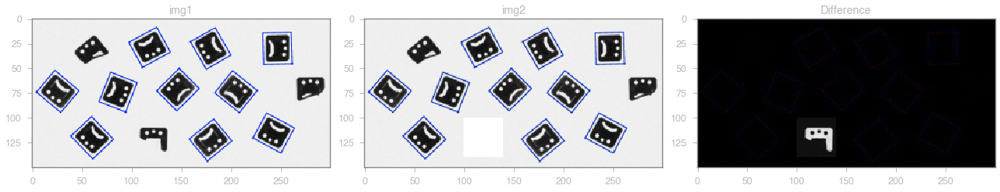

In [2]:
img1 = mpimg.imread('1.jpg')
img2 = mpimg.imread('2.jpg')

# First let's check their dimension
print(img1.shape, img2.shape)

# Extend range so there won't be gibberish
# diff = img2 - img1
diff = img2.astype(np.int16) - img1.astype(np.int16)
diff[diff<0] = 0
imShow([img1, img2, diff], ['img1', 'img2', 'Difference'])

#### Add Two Images

(478, 717, 3) (421, 748, 3)
(421, 748, 3) (421, 748, 3)


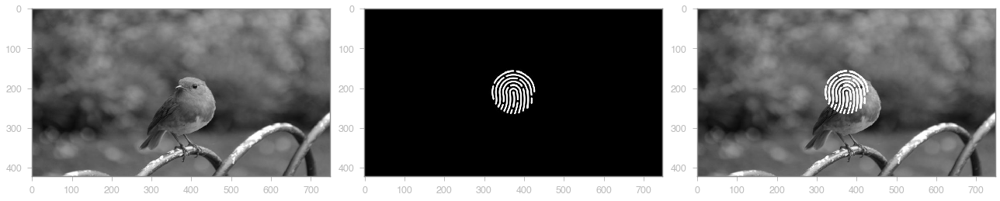

In [3]:
img1 = mpimg.imread('bird.jpg')
img2 = mpimg.imread('back.jpg')
h, w, d = img2.shape
print(img1.shape, img2.shape)
img1 = cv2.resize(img1, (w, h))
print(img1.shape, img2.shape)

add = img2.astype(np.int16) + img1.astype(np.int16)
add[add>255] = 255
imShow([img1, img2, add])

#### Note:
While Adding, subtracting two different images, Be aware that their dimension (ie. img.shape) must be the same.

<a id='Geometric_Transformations'></a>
### [Geometric Transformations](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_geometric_transformations/py_geometric_transformations.html)
#### Rotation, Crop, Resizing Image



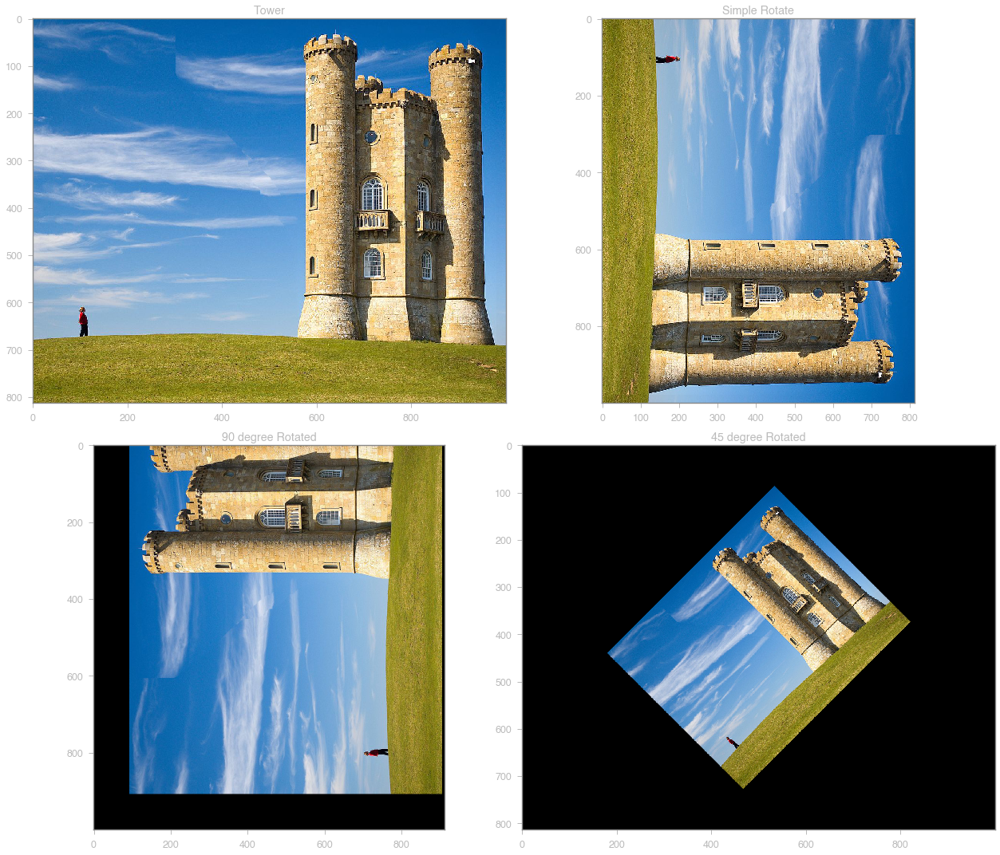

In [4]:
# Rotation
img = mpimg.imread('tower.jpg')
h, w, d = img.shape

simple = cv2.rotate(img, cv2.cv2.ROTATE_90_CLOCKWISE)

# More Flexible This Way
M = cv2.getRotationMatrix2D((w/2, h/2), 90, 1)
rotated = cv2.warpAffine(img, M, (h+100, w))

M = cv2.getRotationMatrix2D((w//2, h//2), 45, 0.5)
rotated_ = cv2.warpAffine(img, M, (w, h))

imShow([img, simple, rotated, rotated_], ['Tower', 'Simple Rotate', '90 degree Rotated', '45 degree Rotated'])

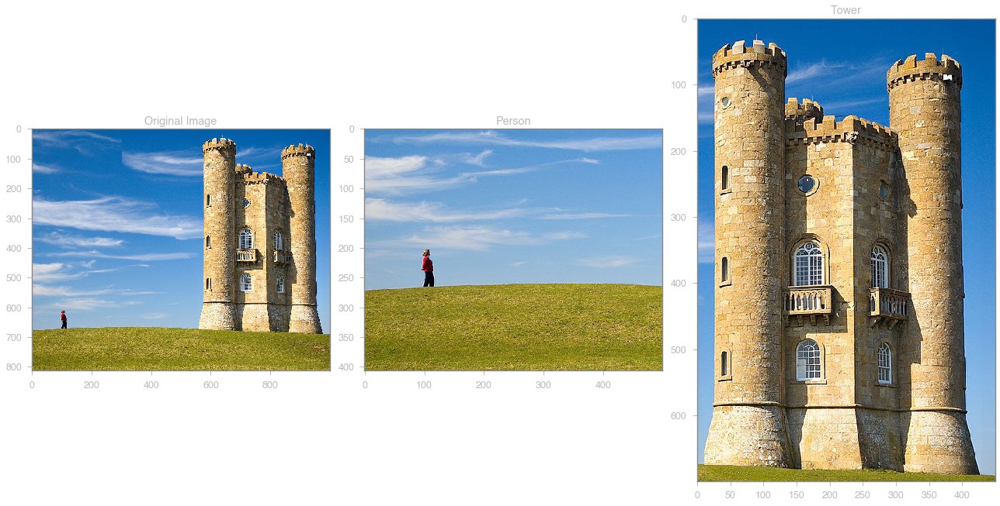

In [5]:
# Crop [Image Slicing]
img_copy = np.copy(img)
h, w, d = img_copy.shape
cropped = img_copy[h//2:, :w//2, :]
tower = img_copy[:700, 550:, :]
imShow([img, cropped, tower], ['Original Image', 'Person', 'Tower'])

<a id='image_enhancing'></a>
### Image Enhancing

#### RGB -> BGR -> HSV
- [X] Play with slider
- [X] Grayscale to Heatmap

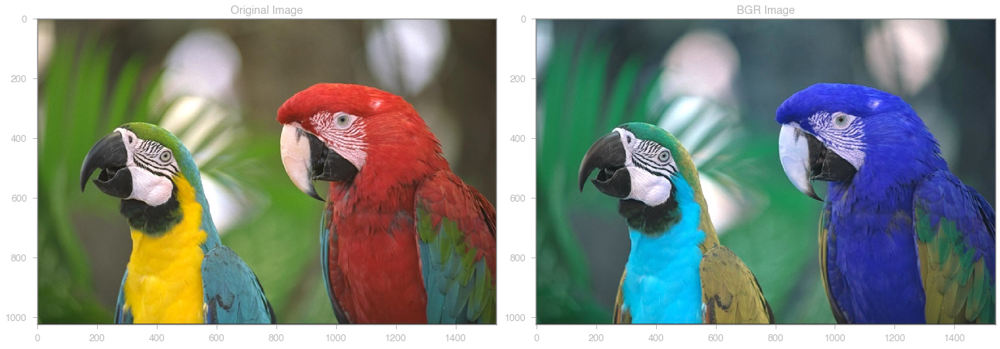

In [6]:
img = mpimg.imread('parrot.jpg')
bgr = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
imShow([img, bgr], ['Original Image', 'BGR Image'])

hue		 0 179 
saturation	 0 255 
value		 0 255


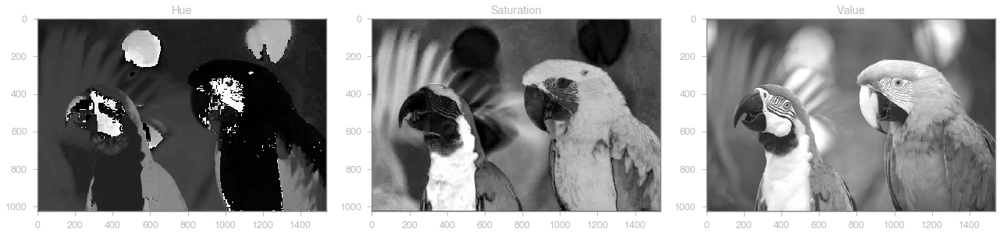

In [7]:
img = mpimg.imread('parrot.jpg')
hsv = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
h = hsv[:, :, 0];s = hsv[:, :, 1];v = hsv[:, :, 2]
print('hue\t\t', np.min(h), np.max(h),
      '\nsaturation\t', np.min(s), np.max(s),
      '\nvalue\t\t', np.min(v), np.max(v))
imShow([h, s, v], ['Hue', 'Saturation', 'Value'])

### Question?

Why would we could HSV while we already have RGB?

(445, 1024) (445, 1024, 3)


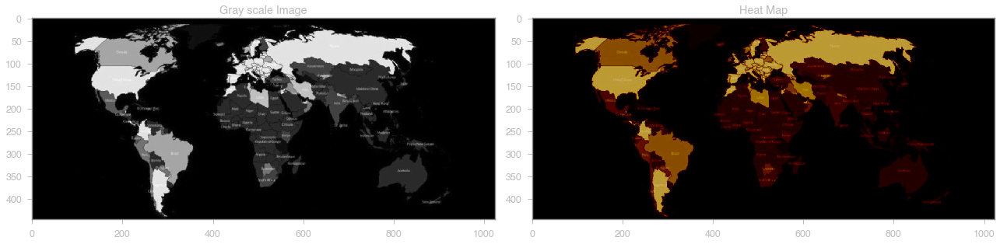

In [8]:
# Grayscale to heatmap
img = mpimg.imread('corona_gray.jpg')
heatmap = cv2.applyColorMap(img, cv2.COLORMAP_OCEAN)
print(img.shape, heatmap.shape)
imShow([img, heatmap], ['Gray scale Image', 'Heat Map'])
# imShow([heatmap])

#### Gray Scale Transform
- [X] Negative
- [X] Log Transform, Gamma Transform

<br>

-----
##### P.S Here, We show with just gray scale, But you can always try with all 3 Color spaces and stack them later with 
> np.dstack((r, g, b))

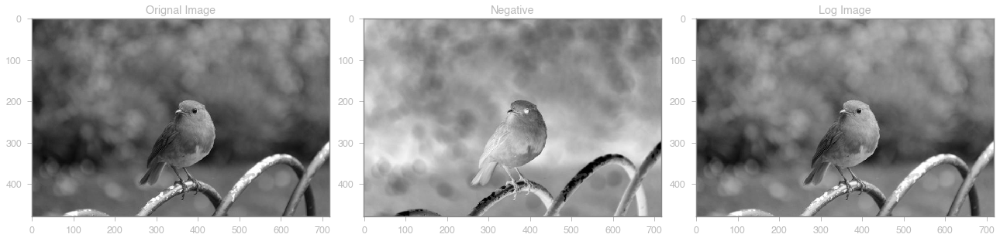

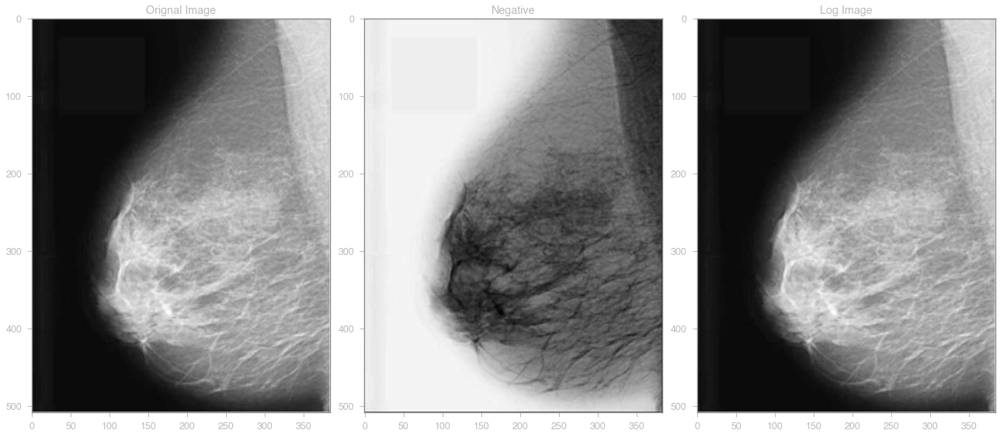

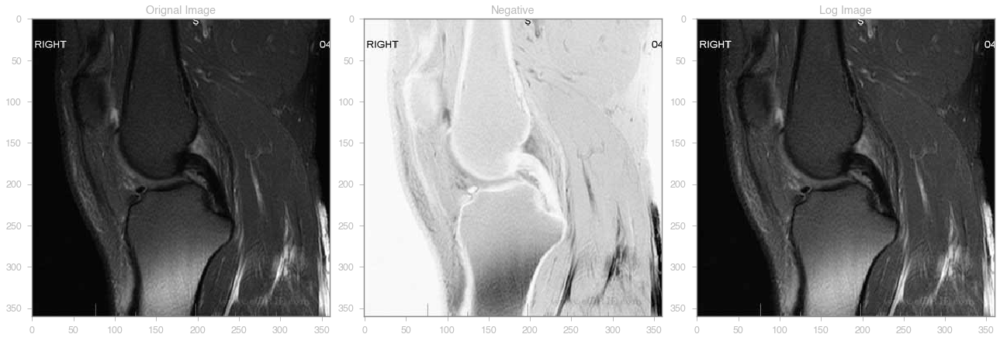

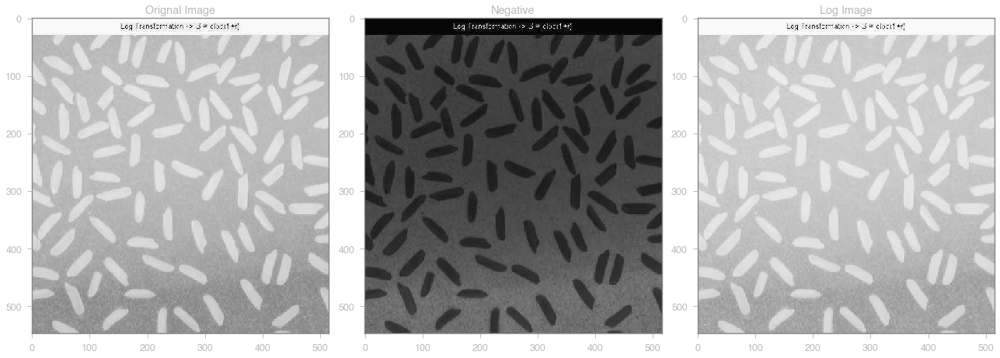

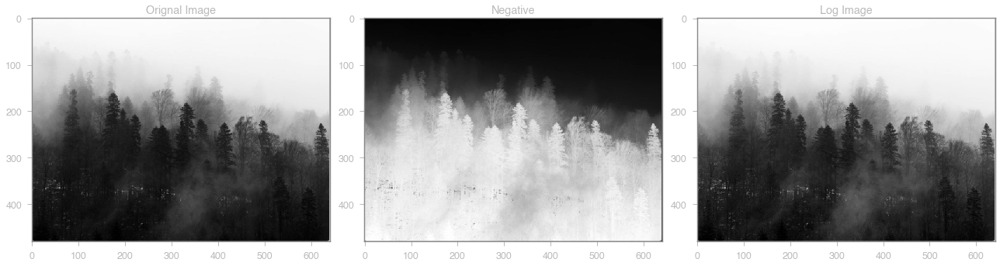

In [11]:
img_names = ['bird.jpg', 'F3.png', 'PCL.jpg', 'cells.jpg', 'tree.jpg']

for img_name in img_names:
    img = mpimg.imread(img_name)
    if img.ndim==3:
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    negative = 255-img
    img_copy = np.copy(img).astype(np.float32)
    img_copy /= 255
    log = np.log(1.0+img_copy)
    

#     imShow([img, negative, log], ['Orignal Image', 'Negative Image', 'Log Image'])
    imShow([img, negative, log], ['Orignal Image', 'Negative', 'Log Image'])

<a id='image_gradient'></a>
### Image Gradient

#### Edge Detection

* Sobel edge (L1), Laplacian Edge (L2)
* Smooth, Sharpen Image

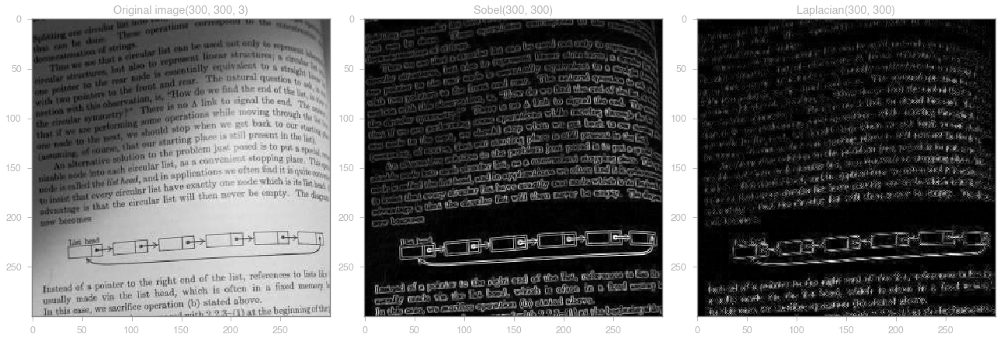

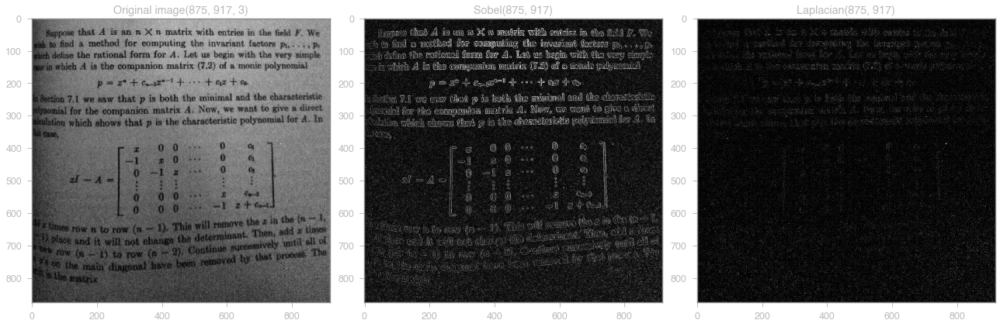

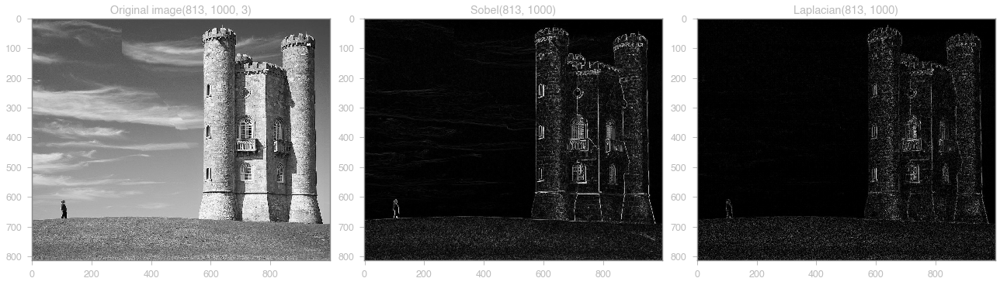

In [12]:
def sobelEdge(img):
    sobelx = np.abs(cv2.Sobel(img, 3, 0, 1)).astype(np.uint32)
    sobely = np.abs(cv2.Sobel(img, 3,1, 0)).astype(np.uint32)
    sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    sobel = (sobel/np.max(sobel)) * 255
    return sobel.astype(np.uint8)

def laplaceEdge(img):
    laplace = np.abs(cv2.Laplacian(img, cv2.CV_64F, ksize=3))
    laplace = ((laplace/np.max(laplace)) * 255).astype(np.uint8)
    return laplace
    
img_names = ['dark.jpg', 'page.jpg','tower.jpg']
for img_name in img_names:
    img = mpimg.imread(img_name)
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    sobel = sobelEdge(gray)
    laplace = laplaceEdge(gray)
    imShow([gray, sobel, laplace], [f'Original image{img.shape}', f'Sobel{sobel.shape}', f'Laplacian{laplace.shape}'])

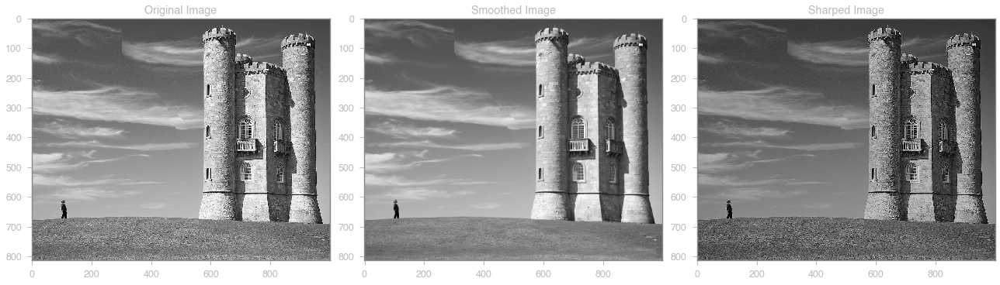

In [13]:
def smooth(img):
    blurred = cv2.GaussianBlur(img, (9,9), 1)
    return blurred

def sharp(img):
    blurred = cv2.GaussianBlur(img, (5, 5), 1).astype(np.float32)
    img = img.astype(np.float32)
    result = np.abs((1.5*img) - (0.5*blurred))
    result = ((result/np.max(result)) * 255).astype(np.uint8)
    return result

blurred = smooth(gray)
sharped = sharp(gray)
imShow([gray, blurred, sharped], ['Original Image', 'Smoothed Image', 'Sharped Image'])

<a id='image_segmentation'></a>
### Image Segmentation

- Image Thresholding
    - difference between 0-1 and 0-255

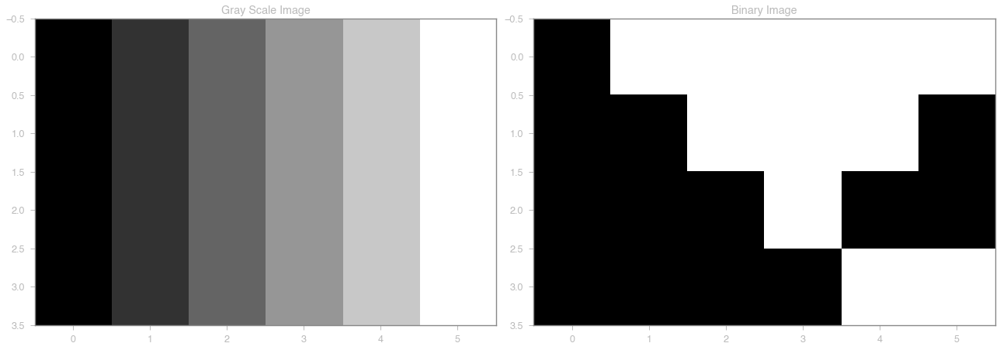

In [14]:
# Gray Scale Image
img1 = np.array([[0, 50, 100, 150, 200, 255],
                [0, 50, 100, 150, 200, 255],
                [0, 50, 100, 150, 200, 255],
                [0, 50, 100, 150, 200, 255]])
# Binary Image
img2 = np.array([[0, 1, 1, 1, 1, 1],
                [0, 0, 1, 1, 1, 0],
                [0, 0, 0, 1, 0, 0],
                [0, 0, 0, 0, 1, 1]])


imShow([img1, img2], ['Gray Scale Image', 'Binary Image'])

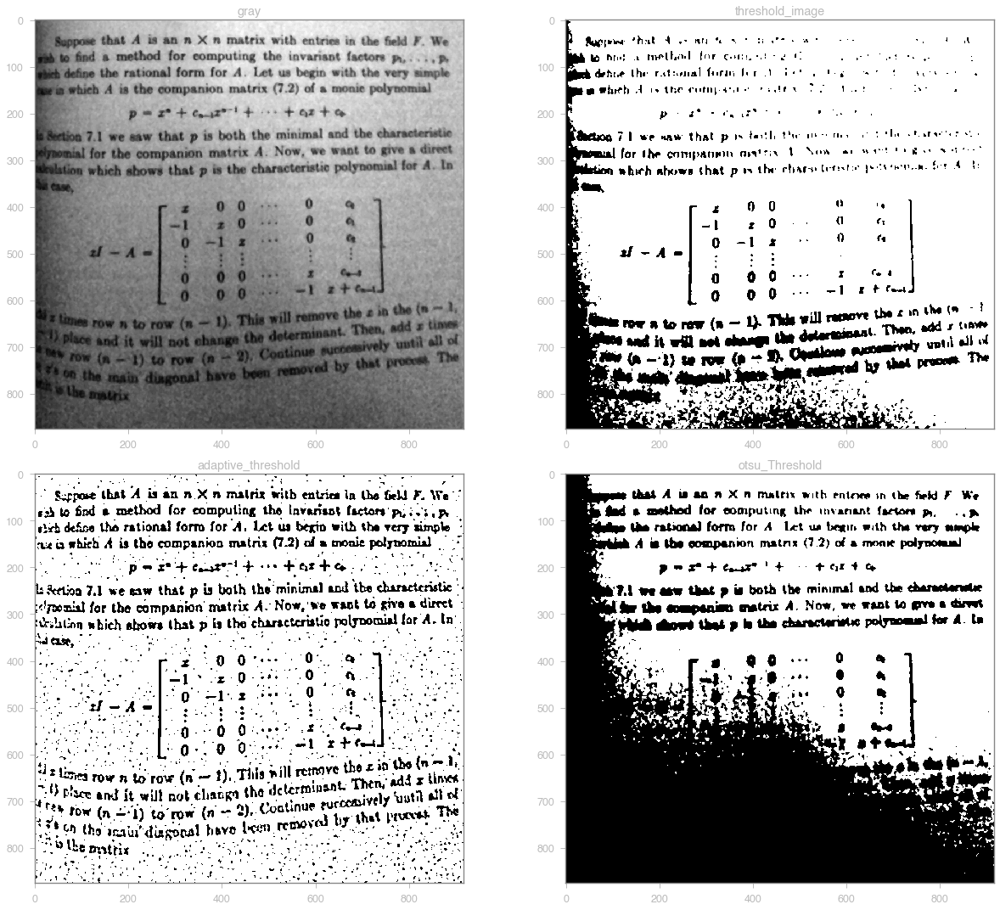

In [15]:
# Global Threshold
img = mpimg.imread('page.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)  # 0 ~ 255
# gray = cv2.GaussianBlur(gray, (5,5), 1)
gray = cv2.medianBlur(gray, 5)
glob_thresh = np.ones_like(gray)
glob_thresh[gray<25] = 0  # 0 & 1

# adap_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
#                                    cv2.THRESH_BINARY, 11, 2)
adap_thresh = cv2.adaptiveThreshold(gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
                                   cv2.THRESH_BINARY, 15, 3)

_, otsu_thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY+cv2.THRESH_OTSU)

imShow([gray, glob_thresh, adap_thresh, otsu_thresh],
       ['gray', 'threshold_image', 'adaptive_threshold', 'otsu_Threshold'])

Since thresholding process is transforming gray scale image to **Binary one**, it is also called binarization.
> Different method for thresholding would be useful in different scenerios.<br>The best way to find the best method is by trial and error.

<a id='morphological'></a>
### [Morphological Transformations](https://docs.opencv.org/master/d9/d61/tutorial_py_morphological_ops.html)

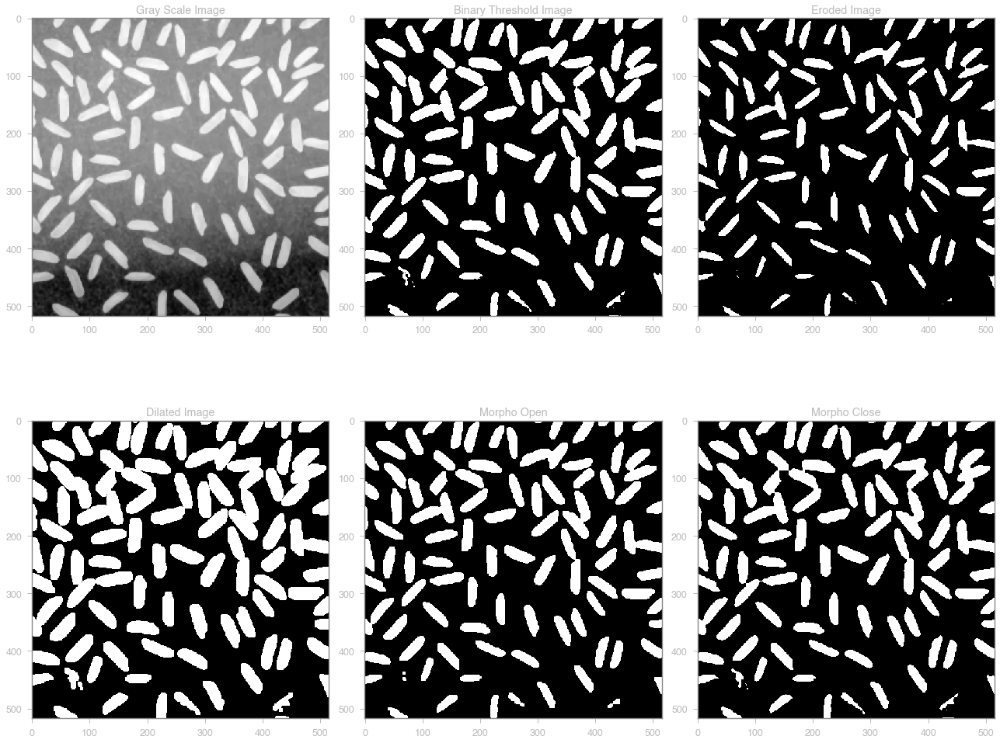

In [16]:
img = mpimg.imread('cells.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
gray = cv2.medianBlur(gray, 5)
gray = gray[30:, :]

# Let's do some thresholding
thresh = np.zeros_like(gray)
# threshold value here get by trial and error
thresh[gray>175] = 1


kernel = np.ones((5,5), np.uint8)
#Erosion
eroded = cv2.erode(thresh, kernel, iterations=1)
#Dilation
dilated = cv2.dilate(thresh, kernel, iterations=1)

# Opening (Erosion + Dilation)
opening = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
# Closing (Dilation + Erosion)
closing = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)
imShow([gray, thresh, eroded, dilated, opening, closing],
       ['Gray Scale Image', 'Binary Threshold Image', 'Eroded Image',
        'Dilated Image', 'Morpho Open', 'Morpho Close'])